# 내가 직접 만드는 강아지 고양이 분류기

In [2]:
# $ pip install pillow

In [3]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


## 이미지 분류 문제

In [4]:
import tensorflow as tf
print(tf.__version__)

2.6.0


## 학습 데이터 준비하기
- tensorflow_datasets란 텐서플로우가 제공하는 데이터셋 모음집

In [5]:
import tensorflow_datasets as tfds
tfds.__version__

'4.4.0'

In [6]:
(raw_train, raw_validation, raw_test), \
    metadata = tfds.load('cats_vs_dogs',
                        split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
                        with_info=True,
                        as_supervised=True,
)

In [7]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


(height, width, channel)의 3차원 데이터 형태로 나타나는데 <br/>
여기서 height와 width가 None으로 나타난 이유는 모든 이미지의 크기가 다르기 때ㅜㅁㄴ

## 전처리

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

- take: 인수로 받은 개수만큼의 데이터 추출하여 새로운 데이터셋 인스턴스 생성해 리턴

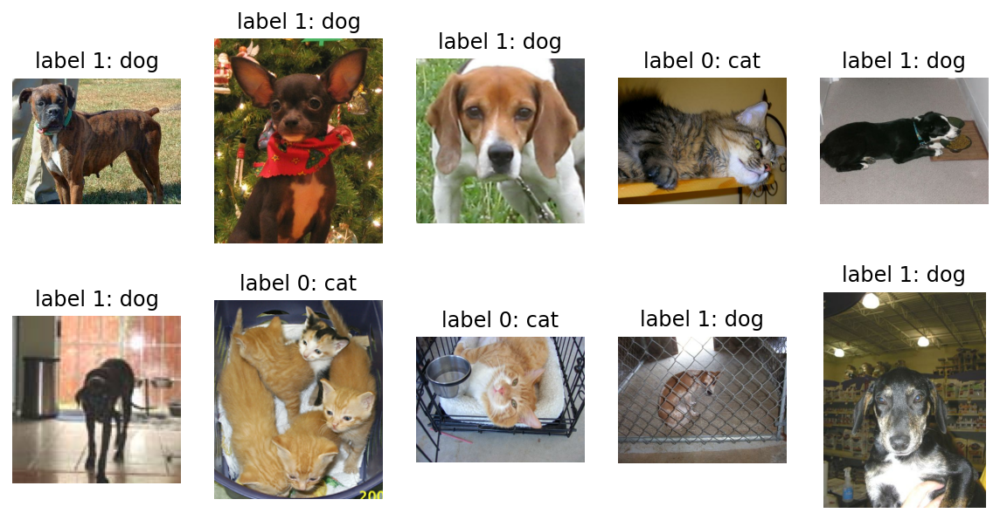

In [9]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)): # 10개의 데이터 가져오기
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')
    
# label: 개(1), 고양이(0)
# get_label_name: 개(dog), 고양이(cat)

이미지 사이즈 통일시키기
- 타입캐스팅(Type Casting) : 다른 데이터 타입으로 형(타입)을 바꿔주는 것

In [10]:
IMG_SIZE = 160 # resizing할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32) # image=float(image)같은 타입캐스팅의 텐서플로우 버전
    image = (image/127.5) - 1 # 픽셀값의 scale 수정 (0~155에서 -1~1)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [11]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


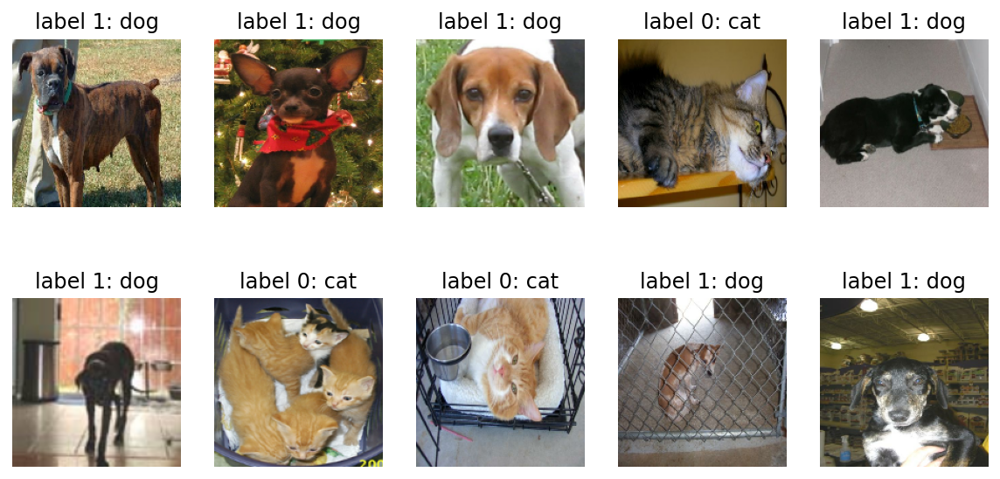

In [12]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image+1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

## 텐서플로우를 활용해 모델 구조 설계하기

In [13]:
# 모델 생성에 필요한 함수들
from tensorflow.keras.models import Sequential # 모델 그 자체를 구축 (Sequential-연속적인 모델)
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D # 모델 구성요소인 layer(층))

Sequential 함수 안에 여러 가지 layer들이 들어가는 것!

In [14]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

딥러닝 모델은 위와 같이 여러 개의 층을 쌓는 형태로 구성된다!
- Conv2D, MaxPooling2D, Flatten, Dense라는 4가지 종류의 레이어 사용함

In [15]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

(None, height, width, channel)
- None은 배치(batch) 사이즈에 따라 모델에 다른 수의 input이 들어올 수 있음을 나타냄
- height, width는 160->80->40->20으로 점점 작아지고,
- channel은 16->32->64로 커지고 있다.
    - 후에 25600 (20x20x64)라는 숫자로 (1차원으로) shape이 줄어듬
    - Flatten과 Dense레이어를 거쳐 1차원으로 shape이 줄어드는 네트워크는 CNN을 사용한 딥러닝 모델의 가장 대표적 형태
    
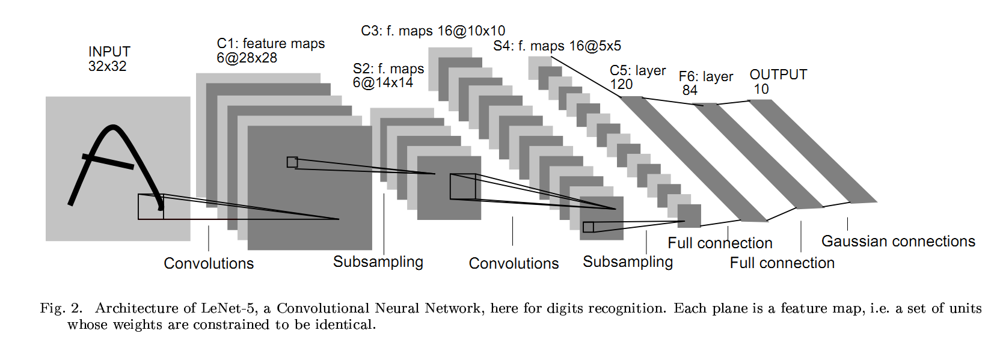
(출처:  Gradient-Based Learning Applied to Document Recognition 논문)
- 맨 왼쪽처럼 한 장의 이미지가 입력으로 온 뒤
- Convolutional(합성곱) 연산을 통해 형태가 점점 길어진 뒤
- Flatten 레이어를 만나면 오른쪽처럼 한 줄로 펴진다.
* 즉, 3차원의 이미지를 1차원으로 펼치는 것!

### Flatten 이해해보기

In [16]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [17]:
# flatten 시켜본다면?
image.flatten() # 모든 숫자를 일렬로 펼쳐놓은 것과 같게 됨

array([1, 2, 3, 4])

이 후 Dense레이어에서는 25,600개를 512개의 노드로 축소시켜 최종 출력은 단 두개의 숫자로 구성된 하나의 확률분포를 보인다.
- 이 두 숫자는 input image가 강아지일 확률, 고양이인 확률을 의미

<br/>
즉, <br/>
딥러닝 모델은 (160, 160, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾼 뒤 최종적으로는 몇 개의 숫자를 출력해내는 함수

## 모델 compile 완료 후 학습시키기

In [18]:
learning_rate = 0.0001 # 학습률

model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
             loss=tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

compile하기 위해서는
- optimizer(최적화 함수): 학습을 어떤 방식으로 시킬 것인지 결정
- loss: 모델이 학습해나가야 하는 방향
    - 고양이(0)일 경우 [1.0, 0.0]에, 강아지(1)의 경우 [0.0, 1.0]에 가까워지도록 방향 제시
- metrics: 모델의 성능 평가하는 척도
    - ex. accuracy, precision, recall

In [19]:
BATCH_SIZE = 32 # 한 스텝에 학습시킨 데이터 수
SHUFFLE_BUFFER_SIZE = 1000 # 학습 데이터 적절히 섞어줄 수

In [20]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

train_batches는 모델이 끊임없이 학습될 수 있도록 랜덤으로 32개 뽑아 계속 제공해주기

In [21]:
# train_batches에서 하나의 batch만 꺼내 확인해보기

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [22]:
# 초기 모델 성능 확인하기

validation_steps = 20 # 20번 예측
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps) # 평균 loss, 평균 accuracy

print('initial loss: {:.2f}'.format(loss0))
print('initial accuaracy: {:.2f}'.format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 0.6879 - accuracy: 0.5398

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 3s 27ms/step - loss: 0.6910 - accuracy: 0.5266
initial loss: 0.69
initial accuaracy: 0.53


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


loss: 70% <br/>
accuracy: 약 50%

- 두 장 중 하나를 찍어도 50%가 나오기 때문에 전혀 의미 없는 예측임

In [23]:
# 10 epoch 학습 시키기 (오래 걸림 !!!)
EPOCHS = 10
history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/10
169/582 [=======>......................] - ETA: 16s - loss: 0.6542 - accuracy: 0.6146

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.6489 - accuracy: 0.6219

213/582 [=========>....................] - ETA: 14s - loss: 0.6485 - accuracy: 0.6225

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.6356 - accuracy: 0.6349

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 3s - loss: 0.6019 - accuracy: 0.6652

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.5996 - accuracy: 0.6676

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.5984 - accuracy: 0.6688

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.5945 - accuracy: 0.6723

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.5936 - accuracy: 0.6733

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5901 - accuracy: 0.6767

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 45ms/step - loss: 0.5901 - accuracy: 0.6767 - val_loss: 0.5204 - val_accuracy: 0.7515
Epoch 2/10
169/582 [=======>......................] - ETA: 16s - loss: 0.5092 - accuracy: 0.7506

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.5041 - accuracy: 0.7567

212/582 [=========>....................] - ETA: 15s - loss: 0.5020 - accuracy: 0.7590

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.4985 - accuracy: 0.7591

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4825 - accuracy: 0.7707

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4813 - accuracy: 0.7715

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.4821 - accuracy: 0.7709

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4807 - accuracy: 0.7711

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4801 - accuracy: 0.7715

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4796 - accuracy: 0.7722

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.4798 - accuracy: 0.7720 - val_loss: 0.5322 - val_accuracy: 0.7468
Epoch 3/10
170/582 [=======>......................] - ETA: 16s - loss: 0.4364 - accuracy: 0.7982

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.4369 - accuracy: 0.7970

213/582 [=========>....................] - ETA: 14s - loss: 0.4370 - accuracy: 0.7964

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.4301 - accuracy: 0.8022

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4205 - accuracy: 0.8068

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.4197 - accuracy: 0.8071

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.4191 - accuracy: 0.8076

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.4176 - accuracy: 0.8080

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.4168 - accuracy: 0.8082

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.4171 - accuracy: 0.8087

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.4169 - accuracy: 0.8088 - val_loss: 0.4834 - val_accuracy: 0.7803
Epoch 4/10
169/582 [=======>......................] - ETA: 16s - loss: 0.3886 - accuracy: 0.8321

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3868 - accuracy: 0.8324

213/582 [=========>....................] - ETA: 14s - loss: 0.3872 - accuracy: 0.8316

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.3802 - accuracy: 0.8356

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3725 - accuracy: 0.8362

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3727 - accuracy: 0.8365

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3712 - accuracy: 0.8375

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3690 - accuracy: 0.8384

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3686 - accuracy: 0.8388

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3669 - accuracy: 0.8392

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.3665 - accuracy: 0.8395 - val_loss: 0.4875 - val_accuracy: 0.7820
Epoch 5/10
170/582 [=======>......................] - ETA: 16s - loss: 0.3403 - accuracy: 0.8515

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.3343 - accuracy: 0.8558

212/582 [=========>....................] - ETA: 15s - loss: 0.3354 - accuracy: 0.8557

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3297 - accuracy: 0.8599

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3231 - accuracy: 0.8638

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3220 - accuracy: 0.8644

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3202 - accuracy: 0.8652

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3192 - accuracy: 0.8663

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3182 - accuracy: 0.8668

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3174 - accuracy: 0.8670

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.3178 - accuracy: 0.8666 - val_loss: 0.5019 - val_accuracy: 0.7794
Epoch 6/10
169/582 [=======>......................] - ETA: 16s - loss: 0.2850 - accuracy: 0.8846

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.2852 - accuracy: 0.8849

213/582 [=========>....................] - ETA: 14s - loss: 0.2844 - accuracy: 0.8851

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.2764 - accuracy: 0.8886

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2733 - accuracy: 0.8901

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2726 - accuracy: 0.8905

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2723 - accuracy: 0.8901

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2696 - accuracy: 0.8917

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2688 - accuracy: 0.8922

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2682 - accuracy: 0.8921

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.2681 - accuracy: 0.8921 - val_loss: 0.4686 - val_accuracy: 0.8100
Epoch 7/10
169/582 [=======>......................] - ETA: 17s - loss: 0.2443 - accuracy: 0.8996

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.2441 - accuracy: 0.8992

213/582 [=========>....................] - ETA: 15s - loss: 0.2422 - accuracy: 0.9002

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.2361 - accuracy: 0.9042

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2249 - accuracy: 0.9088

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2236 - accuracy: 0.9098

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2232 - accuracy: 0.9098

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2217 - accuracy: 0.9107

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2214 - accuracy: 0.9109

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2202 - accuracy: 0.9117

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.2203 - accuracy: 0.9117 - val_loss: 0.5392 - val_accuracy: 0.7855
Epoch 8/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1937 - accuracy: 0.9290

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1915 - accuracy: 0.9274

212/582 [=========>....................] - ETA: 15s - loss: 0.1912 - accuracy: 0.9275

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1879 - accuracy: 0.9287

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1786 - accuracy: 0.9316

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1782 - accuracy: 0.9316

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1773 - accuracy: 0.9319

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1763 - accuracy: 0.9322

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1757 - accuracy: 0.9324

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1746 - accuracy: 0.9334

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.1746 - accuracy: 0.9334 - val_loss: 0.5553 - val_accuracy: 0.8009
Epoch 9/10
171/582 [=======>......................] - ETA: 16s - loss: 0.1456 - accuracy: 0.9472

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.1460 - accuracy: 0.9477

213/582 [=========>....................] - ETA: 14s - loss: 0.1450 - accuracy: 0.9481

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.1416 - accuracy: 0.9499

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1342 - accuracy: 0.9530

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1349 - accuracy: 0.9525

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1340 - accuracy: 0.9530

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1324 - accuracy: 0.9539

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1322 - accuracy: 0.9540

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1305 - accuracy: 0.9549

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.1304 - accuracy: 0.9550 - val_loss: 0.5722 - val_accuracy: 0.7975
Epoch 10/10
169/582 [=======>......................] - ETA: 16s - loss: 0.1116 - accuracy: 0.9636

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.1107 - accuracy: 0.9638

213/582 [=========>....................] - ETA: 15s - loss: 0.1109 - accuracy: 0.9635

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1077 - accuracy: 0.9640

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1002 - accuracy: 0.9673

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.0995 - accuracy: 0.9677

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.0991 - accuracy: 0.9680

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.0982 - accuracy: 0.9684

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.0980 - accuracy: 0.9685

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.0973 - accuracy: 0.9684

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.0972 - accuracy: 0.9684 - val_loss: 0.6844 - val_accuracy: 0.7842


- accuracy: train set에 대한 정확도 (학습하고 있는)
- val_accuracy: validaion set에 대한 정확도 (학습하고 있지 않은)

- train set에 대한 정확도가 높은 것은 당연함!
- 결과) accuracy=0.97, val_accuracy=0.788

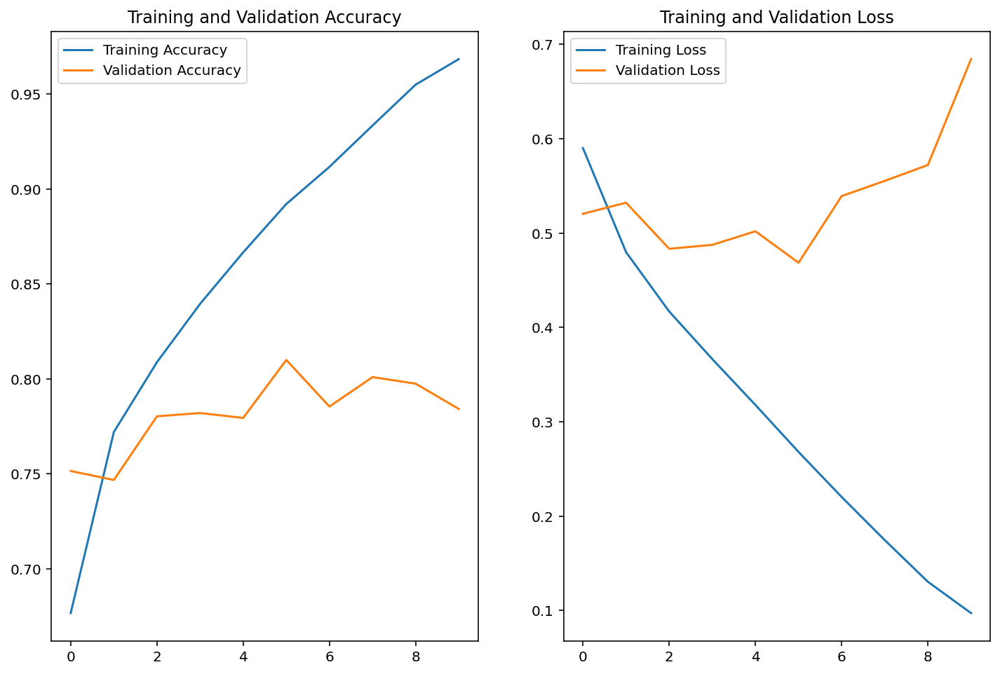

In [24]:
# 학습 단계에 따른 정확도 변화를 그래프로 나타내기

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [25]:
# 검증 정확도가 80%까지 올라간(우리가 학습시킨) 모델의 예측 결과 확인하기

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99873877e-01, 1.26111248e-04],
       [9.16365623e-01, 8.36344063e-02],
       [3.78483012e-02, 9.62151706e-01],
       [9.99354661e-01, 6.45393971e-04],
       [6.37956858e-02, 9.36204314e-01],
       [2.40787551e-01, 7.59212434e-01],
       [1.63632026e-03, 9.98363674e-01],
       [3.64289254e-01, 6.35710776e-01],
       [1.83466785e-02, 9.81653392e-01],
       [2.05948710e-01, 7.94051290e-01],
       [1.25840176e-02, 9.87415969e-01],
       [9.99887347e-01, 1.12588903e-04],
       [9.99359310e-01, 6.40705170e-04],
       [1.21440706e-07, 9.99999881e-01],
       [9.90476727e-01, 9.52324085e-03],
       [9.99380946e-01, 6.19071187e-04],
       [8.68089721e-02, 9.13191080e-01],
       [3.06290349e-06, 9.99996901e-01],
       [5.18689632e-01, 4.81310368e-01],
       [9.57955897e-01, 4.20440994e-02],
       [9.10169363e-01, 8.98306593e-02],
       [9.49273229e-01, 5.07267602e-02],
       [9.98842537e-01, 1.15745876e-03],
       [9.93693113e-01, 6.30692579e-03],
       [5.915517

[고양이일 확률, 강아지일 확률]인데, <br/>
[1.0, 0.0]에 가까울수록 고양이(0)로, [0.0, 1.0]에 가까울수록 강아지(1)로 예측한 것

In [26]:
# prediction 값들을 실제 추론한 라벨(0, 1)로 변환해보기
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1])

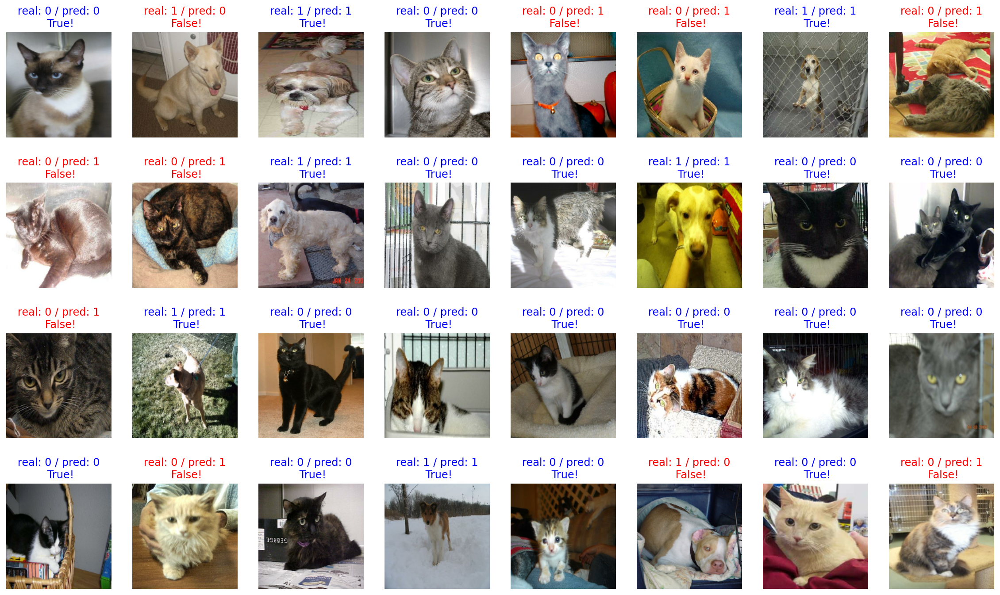

In [27]:
# 시각화하기

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image+1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred: {prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [28]:
# 직접 맞은 예측의 개수를 세는 코드

count = 0 # 정답 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

print(count / 32 * 100)

68.75


## 사전 학습 모델인 VGG16 가져오고, 모델의 구조 확인하기
- IILSVRC 물체 위치 찾기 태스크에서 우승한 VGG 모델

In [29]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                        include_top=False, # output에 가까운 높은 레벨의 3개 FC 레이어는 제외
                                        weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


이 모델은 입력된 이미지를 입력받으면 해당 이미지의 특징을 쏙쏙 잘 뽑아낸 특징 벡터를 추출할 수 있을 것

In [30]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [31]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

이미지의 개수는 32장으로 동일한데, 사이즈가 많이 달라졌다!
- height, width는 5로 줄어들고, channel은 512로 증가함
- 이 벡터를 이미지에서 특징을 추출해 낸 '특징 벡터'라고 부르기도 함

In [32]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

행이 여러 개 있다는 것은, 그만큼 layer 수가 많다!


dense레이어는 빠져있다. Why?
- transfer learning을 수행하며 새로 학습시킬 것이기 때문에

### VGG16 끝단에 classifier 레이어를 붙여 원하는 구조의 분류 모델 만들기
- 모델이 이미지로부터 특징 벡터 내뱉는다는 것 확인함
- 이 특징 벡터로부터 분류할 수 있는 classifier를 구성하자!

In [33]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

classifier을 구성하려면 Fully connected 레이어로 구성해야 함
- Fully connected 레이어? 완전연결계층!
- 이전 계층의 모든 숫자들이 다음 계층의 모든 숫자와 연결되어야 함
- 입력될 수 있는 벡터는 반드시 1차원이어야 함!
- but, 우리가 본 VGG16의 출력 벡터는 3차원이었다.
- 이를 1차원으로 변환해야 할 것이다.
- 위에서 살펴본 3차원 벡터를 일렬로 쭉 펴는 역할의 계층: Flatten 레이어

##### Global Average Pooling
- Flattening보다 조금 더 좋은 방법
- 3차원의 벡터를, 겹겹의 2차원 배열의 평균으로 축소하는 기법
- 즉, 평균값을 이용해 벡터의 차원을 줄이는 기법

In [34]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [35]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape) # 평균이 잘 취해짐

(32, 512)


In [36]:
# 마지막으로 여기에 dense 레이어들을 붙여주기

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_average가 dense_layer을 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 2)


우리의 데이터들은 처음 이미지에서 특징을 추출해줄 VGG16, base_model에 입력되어 특징이 추출된 뒤, 그 특징 벡터는 global_average_layer를 거쳐 마지막에 prediction_layer까지 통과하며 강아지인지, 고양이인지 예측이 될 것

In [37]:
# base_model은 학습시키지 않을 것
base_model.trainable = False

In [38]:
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])

In [39]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


VGG16 안의 복잡한 레이어들은 base_model로 추상화시킨 것

### VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해보기

In [40]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
             loss=tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

In [41]:
validation_steps = 20
loss0, accuaracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 1s - loss: 0.7561 - accuracy: 0.5417

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


17/20 [========================>.....] - ETA: 0s - loss: 0.7619 - accuracy: 0.5349

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 6s 73ms/step - loss: 0.7647 - accuracy: 0.5297
initial loss: 0.76
initial accuracy: 0.53


아직 학습이 되지 않은 상태이니 50%의 정확도!

In [42]:
EPOCHS = 5 # 이전보다 훨씬 빠르게 수렴되므로 5정도도 충분!

history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/5
167/582 [=======>......................] - ETA: 34s - loss: 0.3814 - accuracy: 0.8711

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.3565 - accuracy: 0.8803

210/582 [=========>....................] - ETA: 30s - loss: 0.3500 - accuracy: 0.8820

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.3163 - accuracy: 0.8917

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2661 - accuracy: 0.9038

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2631 - accuracy: 0.9048

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2607 - accuracy: 0.9057

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2561 - accuracy: 0.9073

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2549 - accuracy: 0.9077

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2503 - accuracy: 0.9093

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 60s 100ms/step - loss: 0.2503 - accuracy: 0.9093 - val_loss: 0.1701 - val_accuracy: 0.9321
Epoch 2/5
168/582 [=======>......................] - ETA: 34s - loss: 0.1625 - accuracy: 0.9366

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1632 - accuracy: 0.9369

210/582 [=========>....................] - ETA: 30s - loss: 0.1625 - accuracy: 0.9368

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1613 - accuracy: 0.9365

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1599 - accuracy: 0.9369

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1596 - accuracy: 0.9367

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1595 - accuracy: 0.9367

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1594 - accuracy: 0.9366

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1591 - accuracy: 0.9369

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1577 - accuracy: 0.9373

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 59s 99ms/step - loss: 0.1577 - accuracy: 0.9373 - val_loss: 0.1541 - val_accuracy: 0.9364
Epoch 3/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1443 - accuracy: 0.9392

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1440 - accuracy: 0.9398

210/582 [=========>....................] - ETA: 30s - loss: 0.1457 - accuracy: 0.9394

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1462 - accuracy: 0.9394

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1473 - accuracy: 0.9385

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1463 - accuracy: 0.9392

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1464 - accuracy: 0.9391

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1454 - accuracy: 0.9399

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1452 - accuracy: 0.9400

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1443 - accuracy: 0.9405

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 91ms/step - loss: 0.1443 - accuracy: 0.9405 - val_loss: 0.1493 - val_accuracy: 0.9402
Epoch 4/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1331 - accuracy: 0.9457

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1358 - accuracy: 0.9453

210/582 [=========>....................] - ETA: 30s - loss: 0.1368 - accuracy: 0.9449

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1391 - accuracy: 0.9436

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1396 - accuracy: 0.9432

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1394 - accuracy: 0.9436

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1391 - accuracy: 0.9435

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1382 - accuracy: 0.9436

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1380 - accuracy: 0.9438

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1377 - accuracy: 0.9441

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 91ms/step - loss: 0.1377 - accuracy: 0.9441 - val_loss: 0.1503 - val_accuracy: 0.9402
Epoch 5/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1314 - accuracy: 0.9454

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1325 - accuracy: 0.9450

210/582 [=========>....................] - ETA: 30s - loss: 0.1317 - accuracy: 0.9455

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1353 - accuracy: 0.9443

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1341 - accuracy: 0.9446

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1342 - accuracy: 0.9443

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1344 - accuracy: 0.9442

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1340 - accuracy: 0.9447

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1336 - accuracy: 0.9449

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1330 - accuracy: 0.9451

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 91ms/step - loss: 0.1330 - accuracy: 0.9451 - val_loss: 0.1388 - val_accuracy: 0.9433


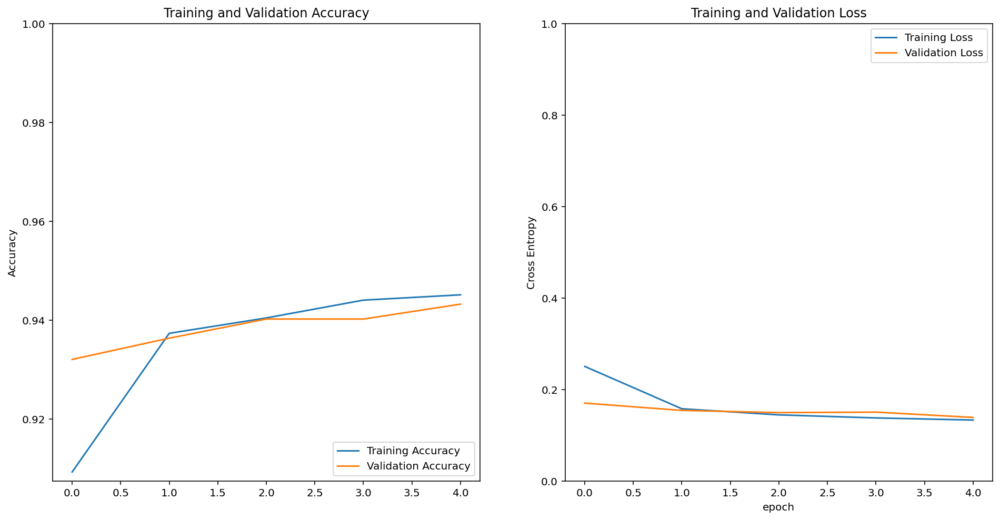

In [43]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

- 우리가 직접 만든 모델과 다르게 정확도도 꾸준히 올라가고
- validation loss도 매우 안정적임!

In [44]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998641e-01, 1.3548917e-05],
       [1.0064763e-01, 8.9935243e-01],
       [3.4494182e-01, 6.5505815e-01],
       [9.9999273e-01, 7.3024912e-06],
       [9.9742979e-01, 2.5702249e-03],
       [9.8524505e-01, 1.4754955e-02],
       [2.0051873e-04, 9.9979955e-01],
       [6.1146492e-01, 3.8853502e-01],
       [9.6057266e-01, 3.9427329e-02],
       [9.6736300e-01, 3.2637008e-02],
       [4.5324377e-05, 9.9995470e-01],
       [9.9995720e-01, 4.2838070e-05],
       [9.9212235e-01, 7.8776311e-03],
       [2.4548549e-06, 9.9999750e-01],
       [9.9866104e-01, 1.3389769e-03],
       [9.8607427e-01, 1.3925690e-02],
       [9.9597281e-01, 4.0271222e-03],
       [2.8764386e-02, 9.7123563e-01],
       [6.1169052e-01, 3.8830948e-01],
       [9.9467409e-01, 5.3259321e-03],
       [9.1851115e-01, 8.1488848e-02],
       [9.8289770e-01, 1.7102376e-02],
       [9.9316871e-01, 6.8313270e-03],
       [9.8260593e-01, 1.7394032e-02],
       [9.9829632e-01, 1.7037092e-03],
       [9.8392671e-01, 1.

In [45]:
# prediction을 라벨로 변환
import numpy as np

predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

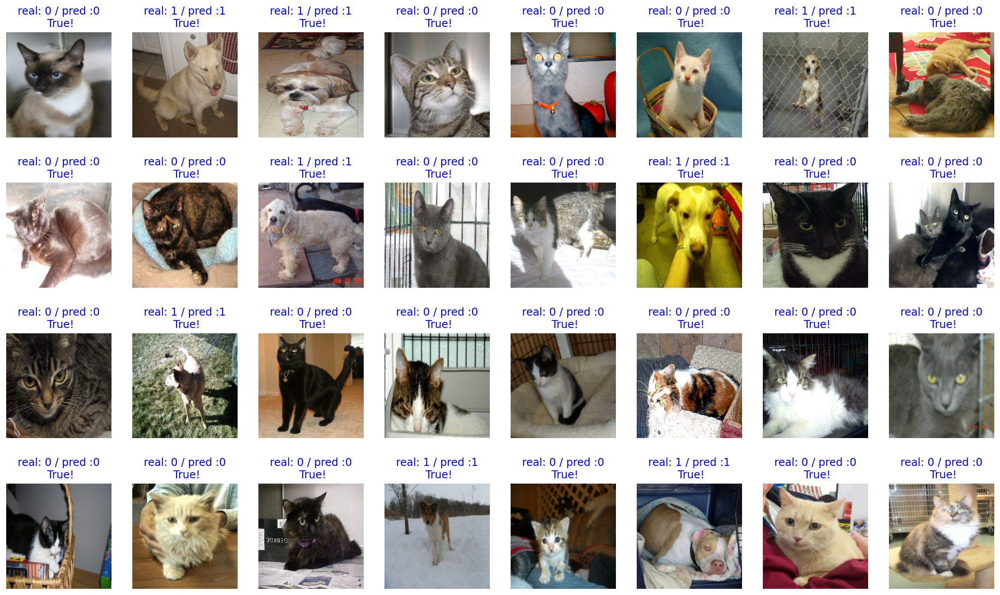

In [47]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
# 아까보다 훨씬 더 잘 맞춘다 !!

In [48]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 거의 100%

100.0


### 모델 save한 뒤 다시 load 해와서 사용해보기

In [49]:
# $ mkdir -p ~/aiffel/cat_vs_dog
# $ mkdir -p ~/aiffel/cat_vs_dog/checkpoint
# $ mkdir -p ~/aiffel/cat_vs_dog/images

In [50]:
import os

checkpoint_dir = os.getenv("HOME") + '/aiffel/cat_vs_dog/checkpoint'
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')

model.save_weights(checkpoint_file_path) # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
    print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


### 학습된 모델에 원하는 이미지 입력해 예측 결과 확인해보기
- 강아지와 고양이 분류하는 모델을 학습시켰으므로 이제 원하는 이미지를 넣어보자!
- dog.jpeg & cat.jpeg

In [51]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [52]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

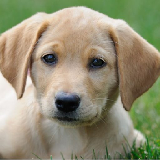

In [53]:
# (160, 160) 사이즈로 변환

IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [55]:
# 모델에 넣을 수 있도록 이미지를 array 형태로 변환해주기

dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

고양이라면 [1.0, 0.0], 강아지라면 [0.0, 1.0]에 가까운 확률 분포가 예측될 것 !! <br/>
So easy?!

In [56]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

In [64]:
# filename만 바꾸면 원하는대로 실행 가능

def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


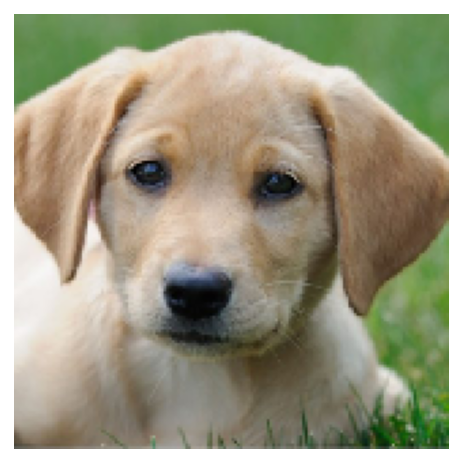

In [65]:
filename = 'my_dog.jpeg'
show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


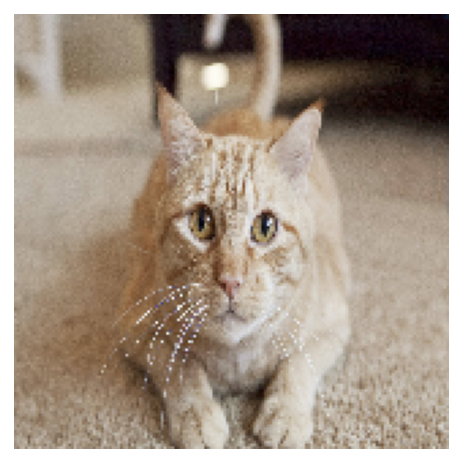

In [67]:
filename = 'my_cat.jpeg'
show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


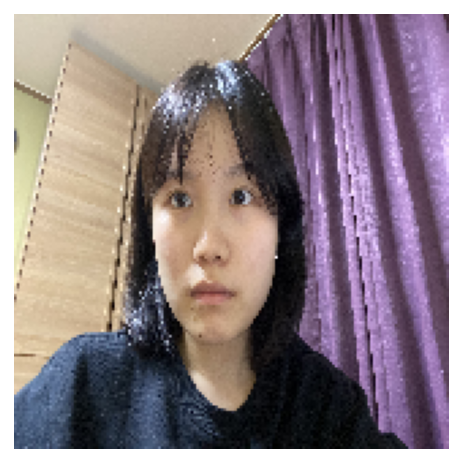

In [70]:
filename = 'my_face.png'
show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


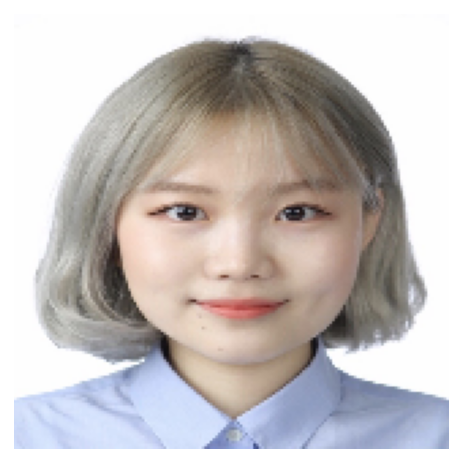

In [71]:
filename = 'my_face2.jpg'
show_and_predict_image(img_dir_path, filename)